
# **<center><font style="color:rgb(100,109,254)">Human Action Recognition in Videos (MobileNetV2 + LSTM)</font> </center>**


### **<font style="color:rgb(134,19,348)"> Import the Libraries</font>**

We will start by installing and importing the required libraries.

In [111]:
# Install the required libraries.
!pip install tensorflow opencv-contrib-python youtube-dl moviepy pydot
!pip install git+https://github.com/TahaAnwar/pafy.git#egg=pafy

  Cloning https://github.com/TahaAnwar/pafy.git to /private/var/folders/6n/_x368nbn0g78hqqcdnnw95k80000gn/T/pip-install-_kfc7pvh/pafy_ec88ae24a97c438d8817f24e81a190ab
  Running command git clone --filter=blob:none --quiet https://github.com/TahaAnwar/pafy.git /private/var/folders/6n/_x368nbn0g78hqqcdnnw95k80000gn/T/pip-install-_kfc7pvh/pafy_ec88ae24a97c438d8817f24e81a190ab
  Resolved https://github.com/TahaAnwar/pafy.git to commit 2f3c473b3df7961721d07e1504675313afd1d2cb
  Preparing metadata (setup.py) ... done


In [112]:
# Import the required libraries.
import os
import cv2
import pafy
import math
import random
import rarfile
import pickle
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt

from moviepy.editor import *
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K


And will set `Numpy`, `Python`, and `Tensorflow` seeds to get consistent results on every execution.

In [113]:
seed_constant = 42
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

## **<font style="color:rgb(134,19,348)">Step 1: Visualize the Data with its Labels</font>**

In the first step, we will visualize the data along with labels to get an idea about what we will be dealing with. We will be using the UCF-101, consisting of realistic videos taken from youtube which differentiates this data set from most of the other available action recognition data sets as they are not realistic and are staged by actors.

For visualization, we will pick `20` random categories from the dataset and a random video from each selected category and will visualize the first frame of the selected videos with their associated labels written. This way we’ll be able to visualize a subset ( `20` random videos ) of the dataset.

In [114]:
# Download the dataset
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF101/UCF101.rar

## Define the path to the .rar file and the extraction directory
rar_path = "UCF101.rar"
extract_path = "UCF101"

## Create extraction directory if it does not exist
os.makedirs(extract_path, exist_ok=True)

## Open and extract the .rar file
with rarfile.RarFile(rar_path) as rf:
    rf.extractall(extract_path)

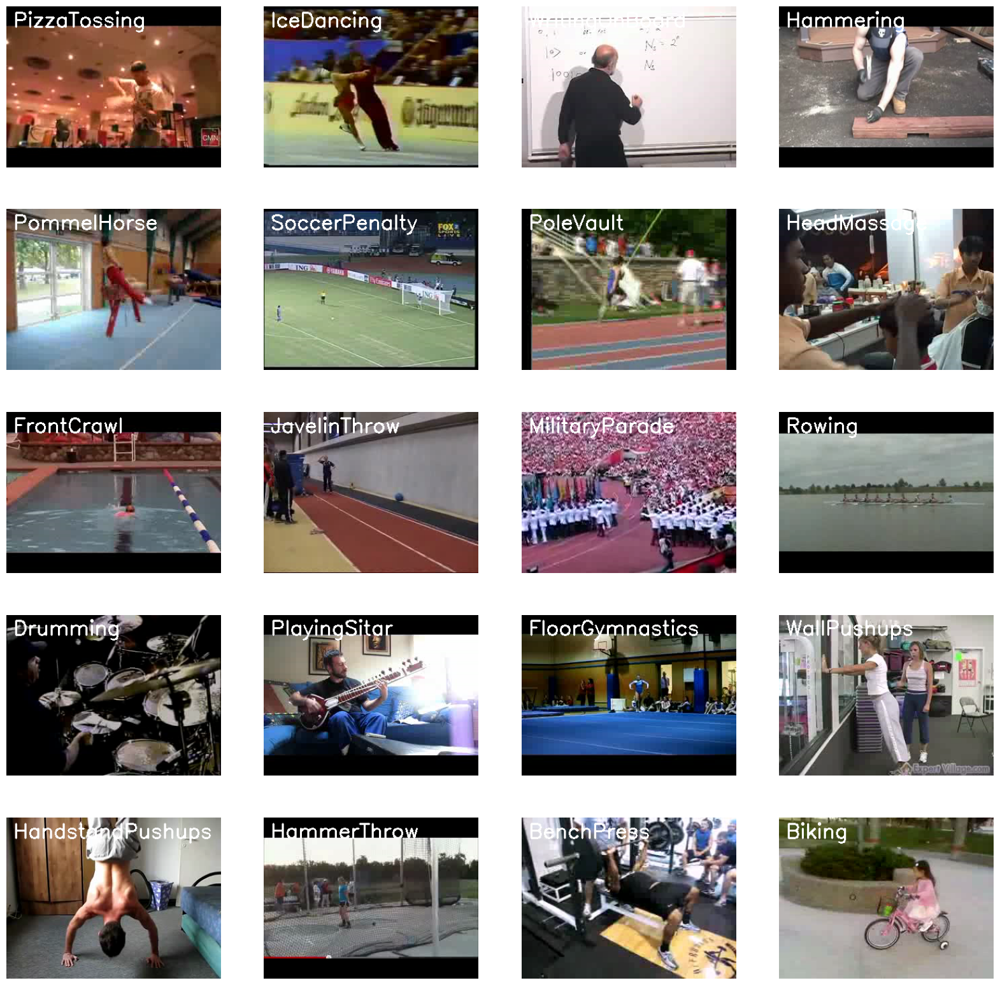

In [115]:
# Create a Matplotlib figure with a specified size.
plt.figure(figsize=(20, 20))

# Get the names of all classes/categories in UCF50.
all_classes_names = os.listdir('UCF101')

# Generate a list of 20 random indices between 0 and the number of classes.
random_range = random.sample(range(len(all_classes_names)), 20)

# Iterate through the generated random indices.
for counter, random_index in enumerate(random_range, 1):

    # Retrieve a class name using the random index.
    selected_class_name = all_classes_names[random_index]

    # Retrieve the list of video files in the selected class directory.
    class_dir = f'UCF101/{selected_class_name}'
    video_files_names_list = os.listdir(class_dir)

    # Randomly select a video file from the list.
    selected_video_file_name = random.choice(video_files_names_list)

    # Initialize a VideoCapture object to read from the selected video file.
    video_reader = cv2.VideoCapture(os.path.join(class_dir, selected_video_file_name))

    # Check if the video was opened successfully.
    if not video_reader.isOpened():
        print(f"Error opening video file: {selected_video_file_name}")
        continue

    # Read the first frame of the video file.
    success, bgr_frame = video_reader.read()

    # Release the VideoCapture object.
    video_reader.release()

    # Check if the frame was read successfully.
    if not success:
        print(f"Error reading frame from video file: {selected_video_file_name}")
        continue

    # Convert the frame from BGR to RGB format.
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Write the class name on the frame.
    cv2.putText(rgb_frame, selected_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the frame in a subplot.
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

# Render the plot with all frames.
plt.show()

## **<font style="color:rgb(134,19,348)">Step 2: Preprocess the Dataset</font>**

Next, we will perform some preprocessing on the dataset. First, we will read the video files from the dataset to extract the frames and agument the frames, resize the frames of the videos to a fixed width and height, to reduce the computations and normalized the data to range `[0-1]` by dividing the pixel values with `255`, which makes convergence faster while training the network.

*But first, let's initialize some constants.*

In [116]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64

# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 20

# Specify the directory containing the UCF50 dataset. 
DATASET_DIR = "UCF101"

# Specify the list containing the names of the classes used for training. Feel free to choose any set of classes.
#CLASSES_LIST = ["WalkingWithDog", "PlayingGuitar", "Swing", "TaiChi", "HorseRiding", "PullUps", "Biking", "Punch"]
CLASSES_LIST = ["HorseRace", "ApplyLipstick", "Archery", "BabyCrawling", "Drumming"]

**Note:** *The **`IMAGE_HEIGHT`**, **`IMAGE_WIDTH`** and **`SEQUENCE_LENGTH`** constants can be increased for better results, although increasing the sequence length is only effective to a certain point, and increasing the values will result in the process being more computationally expensive.*

### **<font style="color:rgb(134,19,348)">Create a Function to Extract, Resize & Normalize Frames</font>**

We will create a function **`frames_extraction()`** that will create a list containing the resized and normalized frames of a video whose path is passed to it as an argument. The function will read the video file frame by frame, although not all frames are added to the list as we will only need an evenly distributed sequence length of frames. 

In [117]:
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a list to store video frames.
    frames_list = []
    
    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video. 
        success, frame = video_reader.read() 

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Release the VideoCapture object. 
    video_reader.release()

    # Return the frames list.
    return frames_list

### **<font style="color:rgb(134,19,348)">Create a Data augmentation Function</font>**

In [118]:
# Data augmentation function
def augment_frame(frames_list):
    data_augmentation = tf.keras.Sequential([
        tf.keras.layers.RandomFlip("horizontal"),
        tf.keras.layers.RandomRotation(0.1),
        tf.keras.layers.RandomZoom(0.1),
        tf.keras.layers.RandomContrast(0.1),
        tf.keras.layers.RandomBrightness(0.1),
        tf.keras.layers.RandomCrop(height=IMAGE_HEIGHT - 5, width=IMAGE_WIDTH - 5),
    ])
    
    # Apply augmentation directly without expanding dimensions
    augmented_frames = [data_augmentation(frame) for frame in frames_list]
    return np.array(augmented_frames)

### **<font style="color:rgb(134,19,348)">Feature Extraction from frames Using MobileNetVs Pretrained Model</font>**

In [119]:
from tensorflow.keras.applications import MobileNetV2

# Load the pre-trained MobileNetV2 model
resnet_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))

# Add GlobalAveragePooling2D to flatten the feature maps
feature_extractor = Sequential([
    resnet_model,
    GlobalAveragePooling2D()  # This will reduce the spatial dimensions and output a vector of size 2048
])

# Extract features
def extract_features(frames):
    frames = np.array(frames)
    features = feature_extractor.predict(frames, batch_size=32)  # Get the feature vectors
    return features

  resnet_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3))



### **<font style="color:rgb(134,19,348)">Create a Function for Dataset Creation</font>**

Now we will create a function **`create_dataset()`** that will iterate through all the classes specified in the **`CLASSES_LIST`** constant and will call the function  **`frame_extraction()`** on every video file of the selected classes and return the frames (**`features`**), class index ( **`labels`**), and video file path (**`video_files_paths`**).

In [120]:
def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []

    # Define valid video file extensions
    valid_extensions = ('.mp4', '.avi', '.mov', '.mkv')  # Add more as needed
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(CLASSES_LIST):
        
        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:

            # Check if the file has a valid video extension
            if not file_name.lower().endswith(valid_extensions):
                continue  # Skip non-video files
            
            # Get the complete video path.
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                # Extract features using ResNet
                augmented_frames = augment_frame(frames)
                frames_features = extract_features(frames)
                features.append(frames_features)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  
    
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

Now we will utilize the function **`create_dataset()`** created above to extract the data of the selected classes and create the required dataset.

In [121]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: HorseRace
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━

Now we will convert `labels` (class indexes) into one-hot encoded vectors.

In [122]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

### **<font style="color:rgb(134,19,348)">Class Distribution</font>**

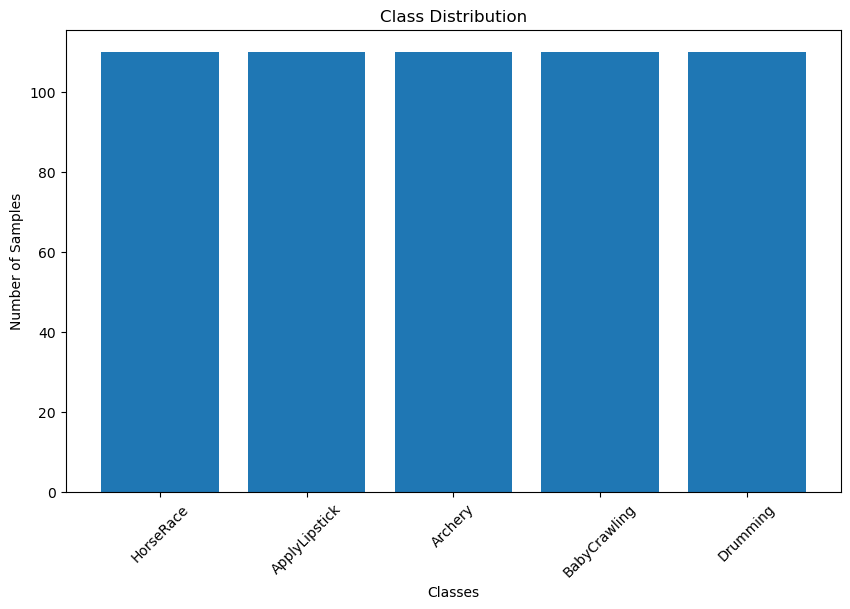

In [123]:
class_distribution = np.bincount(labels)

plt.figure(figsize=(10, 6))
plt.bar(CLASSES_LIST, class_distribution)
plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.show()

### **<font style="color:rgb(134,19,348)">Display Random Sample Frames Per Class</font>**

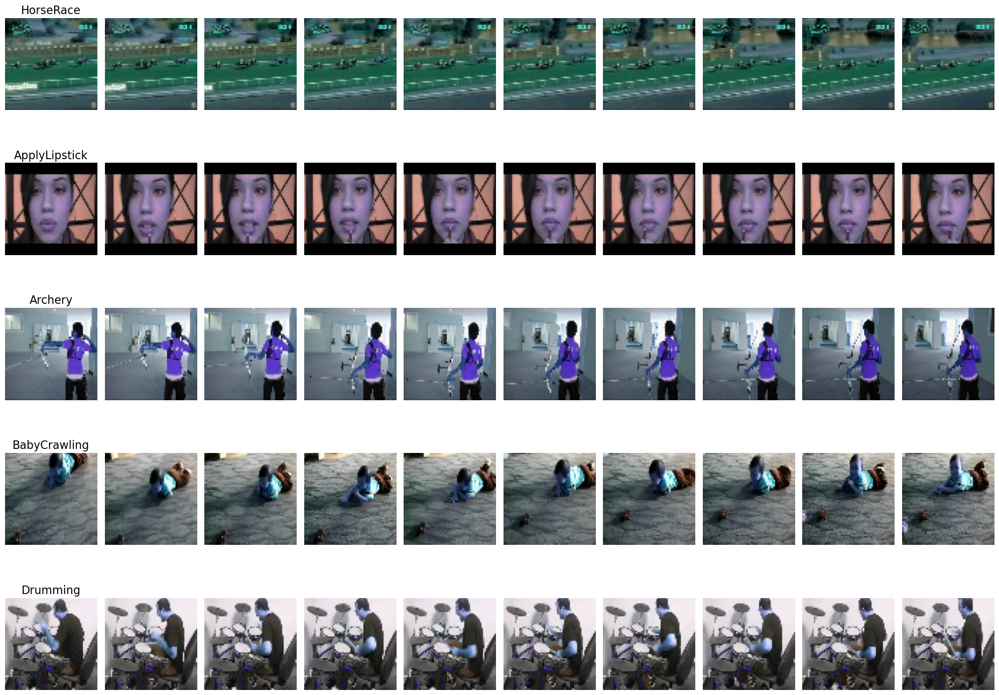

In [124]:
def display_random_sample_frames_per_label(video_files_paths, labels):
    plt.figure(figsize=(20, 15))  # Increased figure size

    # Create a dictionary to hold lists of video paths per label
    videos_per_label = {label: [] for label in range(len(CLASSES_LIST))}

    # Organize videos by their labels
    for index, path in enumerate(video_files_paths):
        label = labels[index].argmax()  # Get the class index from one-hot encoding
        videos_per_label[label].append(path)

    # Randomly select one video for each class label
    selected_videos = []
    for label in range(len(CLASSES_LIST)):
        if videos_per_label[label]:  # Check if there are any videos for this label
            selected_videos.append(random.choice(videos_per_label[label]))

    # Display frames from selected videos
    for i, path in enumerate(selected_videos):  # Display selected videos
        class_label = CLASSES_LIST[i]  # Get the corresponding class label
        frames = frames_extraction(path)
        
        for j, frame in enumerate(frames[:10]):  # Display first 10 frames of each video
            plt.subplot(len(CLASSES_LIST), 10, i * 10 + j + 1)  # Adjusted subplot dimensions
            plt.imshow(frame)
            plt.axis('off')
            if j == 0:  # Display the label on the first frame of each video
                plt.title(class_label, fontsize=16)

    plt.tight_layout()
    plt.show()

display_random_sample_frames_per_label(video_files_paths, one_hot_encoded_labels)


## **<font style="color:rgb(134,19,348)">Step 3: Split the Data into Train and Test Set</font>**

As of now, we have the required **`features`** (a NumPy array containing all the extracted frames of the videos) and **`one_hot_encoded_labels`** (also a Numpy array containing all class labels in one hot encoded format). So now, we will split our data to create training and testing sets. We will also shuffle the dataset before the split to avoid any bias and get splits representing the overall distribution of the data.

In [125]:
# Split the Data into Train ( 75% ) and Test Set ( 25% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True,
                                                                            random_state = seed_constant)

## **<font style="color:rgb(134,19,348)">Step 4: Implement the LSTM Approach</font>**

### **<font style="color:rgb(134,19,348)">Step 4.1: Construct the Model</font>**

In [162]:
def create_lstm_model(sequence_length, feature_dim, num_classes):
    '''
    This function will construct an LSTM model for classification using pre-extracted features.
    Args:
        sequence_length: Number of frames (time steps) in each video.
        feature_dim: Dimensionality of the pre-extracted feature vectors.
        num_classes: Number of output classes.
    Returns:
        model: The constructed LSTM model.
    '''

    model = Sequential()

    # LSTM layer expecting input of shape (sequence_length, feature_dim)
    model.add(LSTM(units=256, return_sequences=True, input_shape=(sequence_length, feature_dim)))
    model.add(Dropout(0.5))
    model.add(LSTM(units=128, return_sequences=False))
    model.add(Dropout(0.5))

    # Fully connected output layer
    model.add(Dense(num_classes, activation="softmax"))

    model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
    model.summary()

    return model

Now we will utilize the function **`create_lstm_model()`** created above, to construct the required `lstm` model.

In [163]:
# Example usage with pre-extracted features:
sequence_length = 20
feature_dim = 1280  # This should match your feature size
num_classes = len(CLASSES_LIST)

# Construct and compile the LSTM model
lstm_model = create_lstm_model(sequence_length, feature_dim, num_classes)

# Display the success message. 
print("Model Created Successfully!")

  super().__init__(**kwargs)



Model: "sequential_1441"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_17 (LSTM)                  │ (None, 20, 256)        │     1,573,888 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 20, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_18 (LSTM)                  │ (None, 128)            │       197,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,771,653 (6.76 MB)

 Trainable params: 1,771,653 (6.76 MB)

 Non-trainable params: 0 (0.00 B)

Model Created Successfully!


### **<font style="color:rgb(134,19,348)">Step 4.2: Compile & Train the Model</font>**

Next, we will add an early stopping callback to prevent [overfitting](https://en.wikipedia.org/wiki/Overfitting) and start the training after compiling the model.

In [169]:
from keras.callbacks import ReduceLROnPlateau

# Create an Instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 5, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics values to the model
lstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Reduce learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)


# Start training the model.
lstm_model_training_history = lstm_model.fit(x = features_train, y = labels_train, epochs = 15, batch_size = 4,
                                                     shuffle = True, validation_split = 0.2, 
                                                     callbacks = [early_stopping_callback, reduce_lr])


Epoch 1/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - accuracy: 0.9830 - loss: 0.0609 - val_accuracy: 0.9277 - val_loss: 0.2334 - learning_rate: 0.0010
Epoch 2/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.9946 - loss: 0.0353 - val_accuracy: 0.9759 - val_loss: 0.0699 - learning_rate: 0.0010
Epoch 3/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.9990 - loss: 0.0032 - val_accuracy: 0.9880 - val_loss: 0.0630 - learning_rate: 0.0010
Epoch 4/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 1.0000 - loss: 0.0011 - val_accuracy: 0.9880 - val_loss: 0.0702 - learning_rate: 0.0010
Epoch 5/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 1.0000 - loss: 0.0010 - val_accuracy: 0.9880 - val_loss: 0.0773 - learning_rate: 0.0010
Epoch 6/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 1.0000 - loss: 6.9124e-04 - val_accuracy: 0.9880 - val_loss: 0.0810 - learning_rate: 0.0010
Epoch 7/15
83/83 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 1.0000 - loss: 5.9149e-04 -

#### **<font style="color:rgb(134,19,348)">Evaluate the Trained Model</font>**

After training, we will evaluate the model on the test set.

In [218]:
# Evaluate the trained model.
model_evaluation_history = lstm_model.evaluate(features_test, labels_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.9963 - loss: 0.0283


#### **<font style="color:rgb(134,19,348)">Save the Model</font>**

Now we will save the model to avoid training it from scratch every time we need the model.

In [219]:
# Get the loss and accuracy from model_evaluation_history.
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# Define the string date format.
# Get the current Date and Time in a DateTime Object.
# Convert the DateTime object to string according to the style mentioned in date_time_format string.
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define a useful name for our model to make it easy for us while navigating through multiple saved models.
model_file_name = f'lstm_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Save your Model.
lstm_model.save(model_file_name)


### **<font style="color:rgb(134,19,348)">Step 4.3: Plot Model’s Loss & Accuracy Curves</font>**


Now we will create a function **`plot_metric()`** to visualize the training and validation metrics. We already have separate metrics from our training and validation steps so now we just have to visualize them.

In [172]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()

Now we will utilize the function **`plot_metric()`** created above, to visualize and understand the metrics.

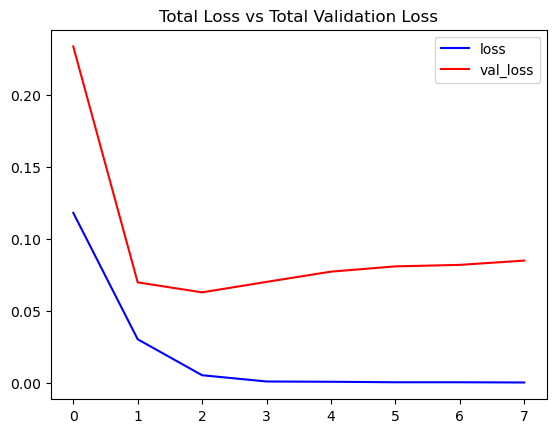

In [173]:
# Visualize the training and validation loss metrices.
plot_metric(lstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

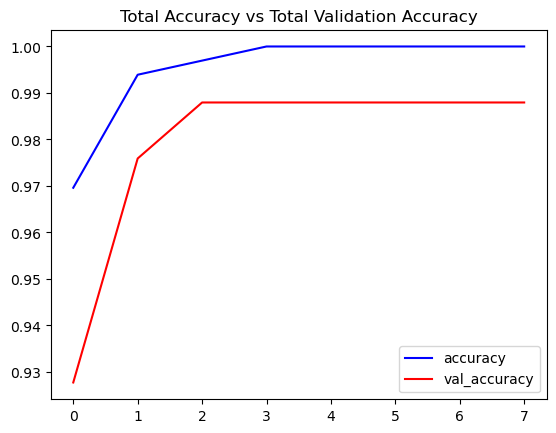

In [174]:
# Visualize the training and validation accuracy metrices.
plot_metric(lstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy') 

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


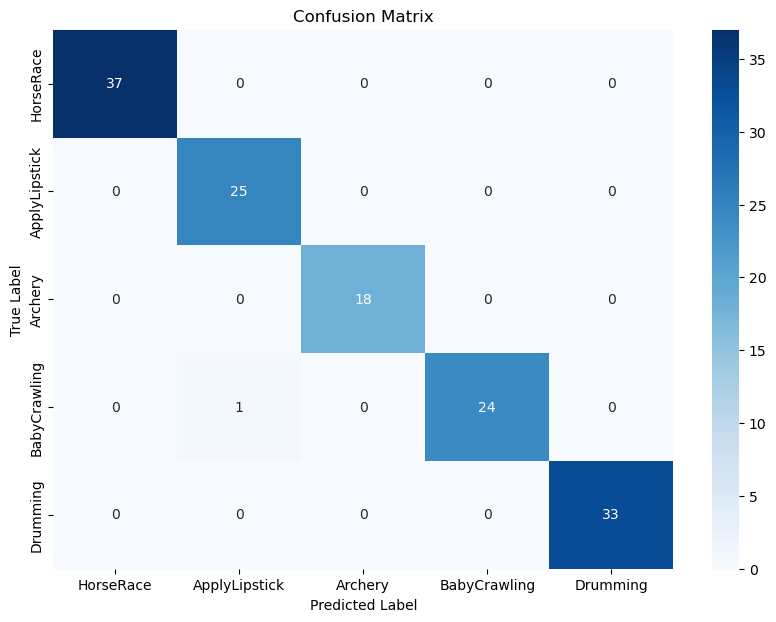

               precision    recall  f1-score   support

    HorseRace       1.00      1.00      1.00        37
ApplyLipstick       0.96      1.00      0.98        25
      Archery       1.00      1.00      1.00        18
 BabyCrawling       1.00      0.96      0.98        25
     Drumming       1.00      1.00      1.00        33

     accuracy                           0.99       138
    macro avg       0.99      0.99      0.99       138
 weighted avg       0.99      0.99      0.99       138



In [175]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns


# Make predictions on the test set
y_pred = lstm_model.predict(features_test)

# Convert one-hot encoded predictions to class indices
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert one-hot encoded true labels to class indices
y_true_classes = np.argmax(labels_test, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES_LIST, yticklabels=CLASSES_LIST)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Optionally, print a classification report for more insights
print(classification_report(y_true_classes, y_pred_classes, target_names=CLASSES_LIST))

## **<font style="color:rgb(134,19,348)">Step 6: Test the Best Performing Model on YouTube videos</font>**

From the results, it seems that the LRCN model performed significantly well for a small number of classes. so in this step, we will put the `LRCN` model to test on some youtube videos. 

In [ ]:
import os
import yt_dlp

def download_youtube_videos(youtube_video_url, output_directory):
    '''
    This function downloads the YouTube video whose URL is passed to it as an argument.
    Args:
        youtube_video_url: The URL of the YouTube video to download.
        output_directory: The directory where the video will be downloaded.
    Returns:
        title: The title of the downloaded YouTube video.
    '''
    # Options for yt-dlp
    ydl_opts = {
        'outtmpl': f'{output_directory}/%(title)s.%(ext)s',  # Output template for the video
        'format': 'best',  # Get the best available quality
    }

    # Use yt-dlp to download the video
    with yt_dlp.YoutubeDL(ydl_opts) as ydl:
        info_dict = ydl.extract_info(youtube_video_url, download=True)
        title = info_dict.get('title', None)
    
    return title

# Make the Output directory if it does not exist
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok=True)


### **<font style="color:rgb(134,19,348)">Create a Function To Perform Action Recognition on Videos</font>**

Next, we will create a function **`predict_on_video()`** that will simply read a video frame by frame from the path passed in as an argument and will perform action recognition on video and save the results.

In [270]:
from tensorflow.keras.applications import MobileNetV2
from collections import deque

# Load the MobileNetV2 model
mobile_net_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')


# Add this function to extract features using MobileNetV2
def extract_features(frame):
    if frame is not None and frame.size > 0:  # Check if the frame is valid
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        normalized_frame = resized_frame / 255.0
        expanded_frame = np.expand_dims(normalized_frame, axis=0)
        features = mobile_net_model.predict(expanded_frame)
        return features.squeeze()
    else:
        return np.zeros((mobile_net_model.output_shape[1],))  # Return zero features for invalid frame

  mobile_net_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg')



### **<font style="color:rgb(134,19,348)">Create a Function To Perform a Single Prediction on Videos</font>**


Now let's create a function that will perform a single prediction for the complete videos. We will extract evenly distributed **N** **`(SEQUENCE_LENGTH)`** frames from the entire video and pass them to the `LRCN` model. This approach is really useful when you are working with videos containing only one activity as it saves unnecessary computations and time in that scenario.  

In [275]:
def predict_single_action(video_file_path, SEQUENCE_LENGTH):
    '''
    This function will perform single action recognition prediction on a video using the LRCN model.
    Args:
    video_file_path:  The path of the video stored in the disk on which the action recognition is to be performed.
    SEQUENCE_LENGTH:  The fixed number of frames of a video that can be passed to the model as one sequence.
    '''

    # Initialize the VideoCapture object to read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)

    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Initialize a variable to store the predicted action being performed in the video.
    predicted_class_name = ''

    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)

    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Read a frame.
        success, frame = video_reader.read() 

        # Check if frame is not read properly then break the loop.
        if not success:
            break

        # Extract features from the current frame
        frame_features = extract_features(frame)

        # Appending the pre-processed frame into the frames list
        frames_list.append(frame_features)
        
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = lstm_model.predict(np.expand_dims(frames_list, axis = 0))[0]

    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)

    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted action along with the prediction confidence.
    print(f'Action Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    # Release the VideoCapture object. 
    video_reader.release()

### **<font style="color:rgb(134,19,348)">Perform Single Prediction on a Test Video</font>**

Now we will utilize the function **`predict_single_action()`** created above to perform a single prediction on a complete youtube test video that we will download using the function **`download_youtube_videos()`**, we had created above.

In [291]:
# Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/shorts/j4hYQUDSBkA', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Increase maxduration for longer videos
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display(maxduration=300)

[youtube] Extracting URL: https://www.youtube.com/shorts/j4hYQUDSBkA
[youtube] j4hYQUDSBkA: Downloading webpage
[youtube] j4hYQUDSBkA: Downloading ios player API JSON
[youtube] j4hYQUDSBkA: Downloading web creator player API JSON
[youtube] j4hYQUDSBkA: Downloading m3u8 information
[info] j4hYQUDSBkA: Downloading 1 format(s): 18
[download] Destination: test_videos/Baby Crawling Funny Videos #shorts.mp4
[download] 100% of  482.96KiB in 00:00:00 at 668.74KiB/s 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 

t:  80%|████████████████████▉     | 359/446 [00:00<00:00, 1806.62it/s, now=None]WARNING:py.warnings:/Users/ayaantmlcena/Documents/Jupyter Notebook/tensorflow-masters-project/env/lib/python3.10/site-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Baby Crawling Funny Videos #shorts.mp4, 151200 bytes wanted but 0 bytes read,at frame 445/446, at time 14.83/14.84 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [292]:
# Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/shorts/wzb10T78xbE', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Increase maxduration for longer videos
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display(maxduration=300)

[youtube] Extracting URL: https://www.youtube.com/shorts/wzb10T78xbE
[youtube] wzb10T78xbE: Downloading webpage
[youtube] wzb10T78xbE: Downloading ios player API JSON
[youtube] wzb10T78xbE: Downloading web creator player API JSON
[youtube] wzb10T78xbE: Downloading m3u8 information
[info] wzb10T78xbE: Downloading 1 format(s): 18
[download] Destination: test_videos/Fighting Arrow dominates the Darley Spring Preview #shorts #horseracing #racing #horse #flemington.mp4
[download] 100% of    2.36MiB in 00:00:01 at 2.28MiB/s   
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━

t:  96%|██████████████████████████ | 794/823 [00:00<00:00, 896.95it/s, now=None]WARNING:py.warnings:/Users/ayaantmlcena/Documents/Jupyter Notebook/tensorflow-masters-project/env/lib/python3.10/site-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/Fighting Arrow dominates the Darley Spring Preview #shorts #horseracing #racing #horse #flemington.mp4, 151200 bytes wanted but 0 bytes read,at frame 821/823, at time 27.37/27.42 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [293]:
# Download the youtube video.
video_title = download_youtube_videos('https://www.youtube.com/shorts/0bl_kLfeDLo', test_videos_directory)

# Construct tihe nput youtube video path
input_video_file_path = f'{test_videos_directory}/{video_title}.mp4'

# Perform Single Prediction on the Test Video.
predict_single_action(input_video_file_path, SEQUENCE_LENGTH)

# Increase maxduration for longer videos
VideoFileClip(input_video_file_path, audio=False, target_resolution=(300,None)).ipython_display(maxduration=300)

[youtube] Extracting URL: https://www.youtube.com/shorts/0bl_kLfeDLo
[youtube] 0bl_kLfeDLo: Downloading webpage
[youtube] 0bl_kLfeDLo: Downloading ios player API JSON
[youtube] 0bl_kLfeDLo: Downloading web creator player API JSON
[youtube] 0bl_kLfeDLo: Downloading m3u8 information
[info] 0bl_kLfeDLo: Downloading 1 format(s): 18
[download] Destination: test_videos/how to apply lipstick properly and give perfect shape to lips. Full link in dis.. #shortvideo.mp4
[download] 100% of  350.94KiB in 00:00:00 at 460.90KiB/s 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━

t:  47%|████████████▏             | 198/423 [00:00<00:00, 1978.50it/s, now=None]WARNING:py.warnings:/Users/ayaantmlcena/Documents/Jupyter Notebook/tensorflow-masters-project/env/lib/python3.10/site-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/how to apply lipstick properly and give perfect shape to lips. Full link in dis.. #shortvideo.mp4, 151200 bytes wanted but 0 bytes read,at frame 422/423, at time 14.07/14.07 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+



Moviepy - Done !
Moviepy - video ready __temp__.mp4
